In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 

In [2]:
rev_data=pd.read_csv(r"D:\capstone_project_3rd\youtube_ad_revenue_dataset (1).csv")
rev_data.head(3)

,video_id,date,views,likes,comments,watch_time_minutes,video_length_minutes,subscribers,category,device,country,ad_revenue_usd
0,vid_3092,2024-09-24 10:50:40.993199,9936,1221.0,320.0,26497.214184,2.862137,228086,Entertainment,TV,IN,203.178237
1,vid_3459,2024-09-22 10:50:40.993199,10017,642.0,346.0,15209.747445,23.738069,736015,Gaming,Tablet,CA,140.880508
2,vid_4784,2024-11-21 10:50:40.993199,10097,1979.0,187.0,57332.658498,26.200634,240534,Education,TV,CA,360.134008


In [3]:
rev_data.describe()

,views,likes,comments,watch_time_minutes,video_length_minutes,subscribers,ad_revenue_usd
count,122400.000000,116283.000000,116288.000000,116295.000000,122400.000000,122400.000000,122400.000000
mean,9999.856283,1099.633618,274.396636,37543.827721,16.014165,502191.719902,252.727210
std,99.881260,519.424089,129.741739,12987.724246,8.083790,288397.470103,61.957052
min,9521.000000,195.000000,48.000000,14659.105562,2.000142,1005.000000,126.590603
25%,9933.000000,650.000000,162.000000,26366.320569,9.004695,252507.500000,199.902018
50%,10000.000000,1103.000000,274.000000,37531.990337,16.005906,503465.500000,252.749699
75%,10067.000000,1547.000000,387.000000,48777.782090,23.021260,752192.000000,305.597518
max,10468.000000,2061.000000,515.000000,61557.670089,29.999799,999997.000000,382.768254


In [4]:
rev_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122400 entries, 0 to 122399
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   video_id              122400 non-null  object 
 1   date                  122400 non-null  object 
 2   views                 122400 non-null  int64  
 3   likes                 116283 non-null  float64
 4   comments              116288 non-null  float64
 5   watch_time_minutes    116295 non-null  float64
 6   video_length_minutes  122400 non-null  float64
 7   subscribers           122400 non-null  int64  
 8   category              122400 non-null  object 
 9   device                122400 non-null  object 
 10  country               122400 non-null  object 
 11  ad_revenue_usd        122400 non-null  float64
dtypes: float64(5), int64(2), object(5)
memory usage: 11.2+ MB


In [5]:
new_rev_data=rev_data.copy()


In [6]:
new_rev_data.drop('video_id',axis=1,inplace=True)
new_rev_data.head(4)


,date,views,likes,comments,watch_time_minutes,video_length_minutes,subscribers,category,device,country,ad_revenue_usd
0,2024-09-24 10:50:40.993199,9936,1221.0,320.0,26497.214184,2.862137,228086,Entertainment,TV,IN,203.178237
1,2024-09-22 10:50:40.993199,10017,642.0,346.0,15209.747445,23.738069,736015,Gaming,Tablet,CA,140.880508
2,2024-11-21 10:50:40.993199,10097,1979.0,187.0,57332.658498,26.200634,240534,Education,TV,CA,360.134008
3,2025-01-28 10:50:40.993199,10034,1191.0,242.0,31334.517771,11.770340,434482,Entertainment,Mobile,UK,224.638261


In [7]:
new_rev_data.date.unique()

array(['2024-09-24 10:50:40.993199', '2024-09-22 10:50:40.993199',
       '2024-11-21 10:50:40.993199', '2025-01-28 10:50:40.993199',
       '2025-04-28 10:50:40.993199', '2025-03-31 10:50:40.993199',
       '2024-12-10 10:50:40.993199', '2025-04-05 10:50:40.993199',
       '2025-02-17 10:50:40.993199', '2025-04-16 10:50:40.993199',
       '2025-01-05 10:50:40.993199', '2025-01-08 10:50:40.993199',
       '2024-06-11 10:50:40.993199', '2025-05-16 10:50:40.993199',
       '2025-02-01 10:50:40.993199', '2025-05-19 10:50:40.993199',
       '2025-03-08 10:50:40.993199', '2025-03-16 10:50:40.993199',
       '2024-07-27 10:50:40.993199', '2025-01-18 10:50:40.993199',
       '2024-11-27 10:50:40.993199', '2025-03-25 10:50:40.993199',
       '2024-12-03 10:50:40.993199', '2024-06-12 10:50:40.993199',
       '2025-06-02 10:50:40.993199', '2025-05-17 10:50:40.993199',
       '2025-03-17 10:50:40.993199', '2025-01-31 10:50:40.993199',
       '2024-11-22 10:50:40.993199', '2025-01-22 10:50:40.9931

In [8]:
new_rev_data.drop_duplicates(inplace=True)
new_rev_data.reset_index(drop=True, inplace=True)


In [9]:
new_rev_data.columns


Index(['date', 'views', 'likes', 'comments', 'watch_time_minutes',
       'video_length_minutes', 'subscribers', 'category', 'device', 'country',
       'ad_revenue_usd'],
      dtype='object')

In [10]:
for i in ('category','device','country'):
    new_rev_data[i]=new_rev_data[i].str.strip()
print(new_rev_data.category	.unique())
print(new_rev_data.device.unique())
print(new_rev_data.country.unique())



['Entertainment' 'Gaming' 'Education' 'Music' 'Tech' 'Lifestyle']
['TV' 'Tablet' 'Mobile' 'Desktop']
['IN' 'CA' 'UK' 'US' 'DE' 'AU']


In [11]:
new_rev_data['date']=new_rev_data['date'].astype('datetime64[ns]')

In [12]:
watch_fna = new_rev_data.groupby('category')['watch_time_minutes'].mean()
new_rev_data['watch_time_minutes'] = new_rev_data['watch_time_minutes'].fillna(new_rev_data['category'].map(watch_fna))


In [13]:
lik_fna=new_rev_data.groupby('category')['likes'].mean()
new_rev_data['likes'] = new_rev_data['likes'].fillna(new_rev_data['category'].map(lik_fna))

In [14]:
com_fna=new_rev_data.groupby('category')['comments'].mean()
new_rev_data['comments'] = new_rev_data['comments'].fillna(new_rev_data['category'].map(com_fna))

In [15]:
new_rev_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120000 entries, 0 to 119999
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   date                  120000 non-null  datetime64[ns]
 1   views                 120000 non-null  int64         
 2   likes                 120000 non-null  float64       
 3   comments              120000 non-null  float64       
 4   watch_time_minutes    120000 non-null  float64       
 5   video_length_minutes  120000 non-null  float64       
 6   subscribers           120000 non-null  int64         
 7   category              120000 non-null  object        
 8   device                120000 non-null  object        
 9   country               120000 non-null  object        
 10  ad_revenue_usd        120000 non-null  float64       
dtypes: datetime64[ns](1), float64(5), int64(2), object(3)
memory usage: 10.1+ MB


In [16]:
new_rev_data.head(2)

,date,views,likes,comments,watch_time_minutes,video_length_minutes,subscribers,category,device,country,ad_revenue_usd
0,2024-09-24 10:50:40.993199,9936,1221.0,320.0,26497.214184,2.862137,228086,Entertainment,TV,IN,203.178237
1,2024-09-22 10:50:40.993199,10017,642.0,346.0,15209.747445,23.738069,736015,Gaming,Tablet,CA,140.880508


In [17]:
new_rev_data['year'] = new_rev_data['date'].dt.year

In [18]:
new_rev_data['engagement_rate'] = (new_rev_data['likes'] + new_rev_data ['comments']) / new_rev_data['views']

In [19]:
new_rev_data['time'] = new_rev_data['date'].dt.time

In [20]:
new_rev_data.head(2)

,date,views,likes,comments,watch_time_minutes,video_length_minutes,subscribers,category,device,country,ad_revenue_usd,year,engagement_rate,time
0,2024-09-24 10:50:40.993199,9936,1221.0,320.0,26497.214184,2.862137,228086,Entertainment,TV,IN,203.178237,2024,0.155093,10:50:40.993199
1,2024-09-22 10:50:40.993199,10017,642.0,346.0,15209.747445,23.738069,736015,Gaming,Tablet,CA,140.880508,2024,0.098632,10:50:40.993199


In [21]:
new_rev_data['month'] = new_rev_data['date'].dt.month

In [22]:
new_rev_data['dates'] = new_rev_data['date'].dt.day

In [23]:
new_rev_data['date'] = pd.to_datetime(
    dict(
        year=new_rev_data['year'],
        month=new_rev_data['month'],
        day=new_rev_data['dates']
    )
)



In [24]:
new_rev_data['days'] = new_rev_data['date'].dt.weekday # Monday=0, Sunday=6

new_rev_data['weekend'] = new_rev_data['days'].isin([5, 6]).astype(int) # 1 for weekend, 0 for weekday



In [25]:
new_rev_data.head()

,date,views,likes,comments,watch_time_minutes,video_length_minutes,subscribers,category,device,country,ad_revenue_usd,year,engagement_rate,time,month,dates,days,weekend
0,2024-09-24,9936,1221.0,320.0,26497.214184,2.862137,228086,Entertainment,TV,IN,203.178237,2024,0.155093,10:50:40.993199,9,24,1,0
1,2024-09-22,10017,642.0,346.0,15209.747445,23.738069,736015,Gaming,Tablet,CA,140.880508,2024,0.098632,10:50:40.993199,9,22,6,1
2,2024-11-21,10097,1979.0,187.0,57332.658498,26.200634,240534,Education,TV,CA,360.134008,2024,0.214519,10:50:40.993199,11,21,3,0
3,2025-01-28,10034,1191.0,242.0,31334.517771,11.770340,434482,Entertainment,Mobile,UK,224.638261,2025,0.142814,10:50:40.993199,1,28,1,0
4,2025-04-28,9889,1858.0,477.0,15665.666434,6.635854,42030,Education,Mobile,CA,165.514388,2025,0.236121,10:50:40.993199,4,28,0,0


In [26]:
new_rev_data.drop('date', axis=1, inplace=True)
new_rev_data.drop('time', axis=1, inplace=True)

In [27]:
new_rev_data.tail(2)

,views,likes,comments,watch_time_minutes,video_length_minutes,subscribers,category,device,country,ad_revenue_usd,year,engagement_rate,month,dates,days,weekend
119998,10240,1616.0,106.000000,56967.384382,7.753099,585138,Music,Mobile,UK,351.525811,2024,0.168164,12,22,6,1
119999,9931,770.0,274.623367,38466.837135,27.305703,517587,Tech,TV,CA,253.842824,2024,0.105188,6,25,1,0


In [28]:
new_rev_data[new_rev_data.duplicated(keep=False)]

,views,likes,comments,watch_time_minutes,video_length_minutes,subscribers,category,device,country,ad_revenue_usd,year,engagement_rate,month,dates,days,weekend


In [29]:
new_rev_data.shape


(120000, 16)

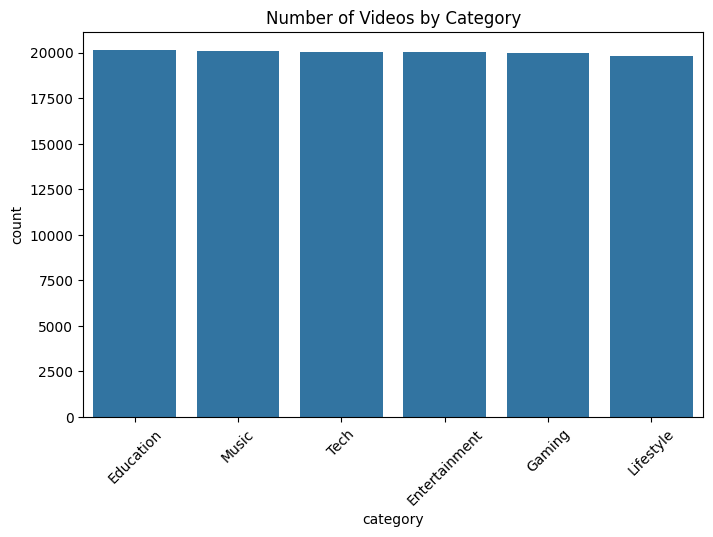

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.countplot(data=new_rev_data, x='category', order=new_rev_data['category'].value_counts().index)
plt.title("Number of Videos by Category")
plt.xticks(rotation=45)
plt.show()


In [31]:
import plotly.express as px

category_revenue = new_rev_data.groupby('category')['ad_revenue_usd'].sum().reset_index()

fig = px.pie(category_revenue,names='category',values='ad_revenue_usd', title='Revenue Contribution by Category')
fig.show()


In [32]:
fig = px.scatter(
    new_rev_data,
    x='views',
    y='ad_revenue_usd',
    color='category',
    title='Views vs Ad Revenue',
    trendline='ols'
)
fig.show()


In [33]:
fig = px.scatter(
    new_rev_data,
    x='views',
    y='engagement_rate',
    color='category',
    title='Engagement Rate vs Views'
)
fig.show()


In [34]:
device_category = (
    new_rev_data
    .groupby(['category','device'])
    .size()
    .reset_index(name='count')
)

fig = px.bar(
    device_category,
    x='category',
    y='count',
    color='device',
    title='Category-wise Device Usage',
    barmode='stack'
)
fig.show()


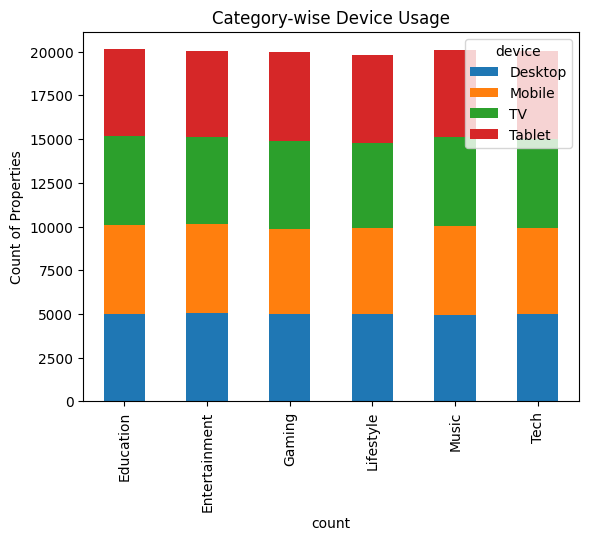

In [35]:
pd.crosstab(new_rev_data.category, new_rev_data.device).plot(kind = 'bar', stacked = True)

plt.title('Category-wise Device Usage')
plt.xlabel('count')
plt.ylabel("Count of Properties")
plt.show()

In [36]:
country_revenue = (
    new_rev_data.groupby('country')['ad_revenue_usd']
    .sum()
    .sort_values(ascending=False)
    .reset_index()
)

fig = px.bar(
    country_revenue,
    x='country',
    y='ad_revenue_usd',
    title='Total Revenue by Country'
)
fig.show()


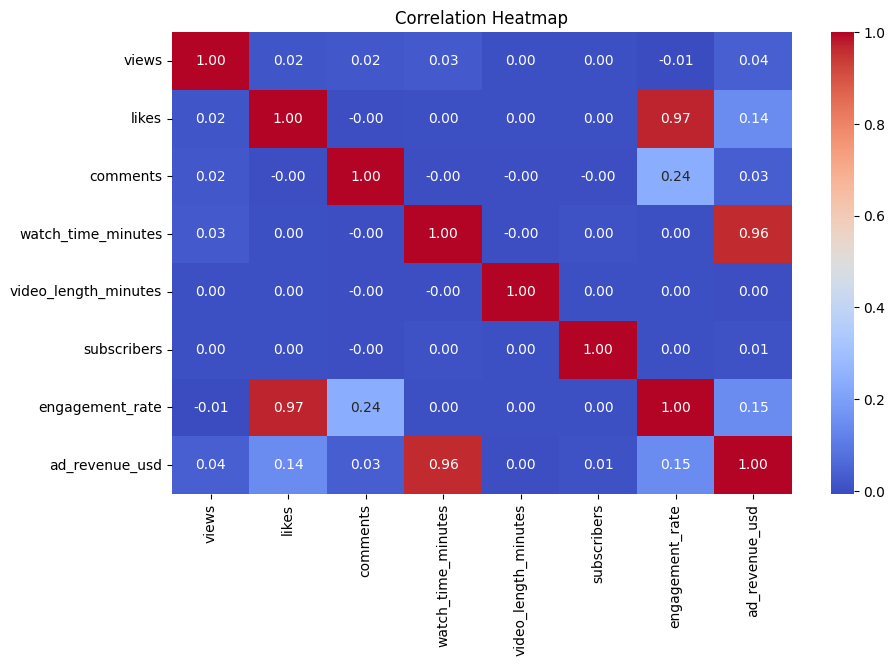

In [37]:
plt.figure(figsize=(10,6))
sns.heatmap(
    new_rev_data[
        ['views','likes','comments','watch_time_minutes',
         'video_length_minutes','subscribers','engagement_rate','ad_revenue_usd']
    ].corr(),
    annot=True,
    cmap='coolwarm',
    fmt=".2f"
)
plt.title("Correlation Heatmap")
plt.show()


In [38]:
monthly_revenue = (
    new_rev_data.groupby(['year','month'])['ad_revenue_usd']
    .sum()
    .reset_index()
)

monthly_revenue['year_month'] = monthly_revenue['year'].astype(str) + '-' + monthly_revenue['month'].astype(str)

fig = px.line(
    monthly_revenue,
    x='year_month',
    y='ad_revenue_usd',
    title='Monthly Revenue Trend'
)
fig.show()


In [39]:
fig = px.scatter(
    new_rev_data,
    x='video_length_minutes',
    y='engagement_rate',
    color='category',
    title='Video Length vs Engagement'
)
fig.show()



In [40]:
new_rev_data.head(6)

,views,likes,comments,watch_time_minutes,video_length_minutes,subscribers,category,device,country,ad_revenue_usd,year,engagement_rate,month,dates,days,weekend
0,9936,1221.0,320.0,26497.214184,2.862137,228086,Entertainment,TV,IN,203.178237,2024,0.155093,9,24,1,0
1,10017,642.0,346.0,15209.747445,23.738069,736015,Gaming,Tablet,CA,140.880508,2024,0.098632,9,22,6,1
2,10097,1979.0,187.0,57332.658498,26.200634,240534,Education,TV,CA,360.134008,2024,0.214519,11,21,3,0
3,10034,1191.0,242.0,31334.517771,11.770340,434482,Entertainment,Mobile,UK,224.638261,2025,0.142814,1,28,1,0
4,9889,1858.0,477.0,15665.666434,6.635854,42030,Education,Mobile,CA,165.514388,2025,0.236121,4,28,0,0
5,10002,843.0,159.0,35131.756228,12.491826,541268,Music,TV,CA,234.965996,2025,0.100180,3,31,0,0


In [41]:
import plotly.express as px

fig = px.box(new_rev_data, y="views")
fig.show()

In [42]:

log_frame = new_rev_data.loc[:,['views','comments']]

log_frame['views_log'] = np.log(log_frame['views'])

In [43]:
import plotly.express as px

fig = px.box(log_frame, y="views_log")
fig.show()

In [44]:
import numpy as np

sqrt_frame = new_rev_data.loc[:,['views','comments']]

sqrt_frame['views_sqrt'] = np.sqrt(sqrt_frame['views'])


In [45]:
import plotly.express as px

fig = px.box(sqrt_frame, y="views")
fig.show()

In [46]:
new_rev_data.loc[:,['views','comments']]


q1 = new_rev_data.views.quantile(0.25)
q3 = new_rev_data.views.quantile(0.75)
iqr = q3 - q1

lower_bound = q1 - (1.5 * iqr)
upper_bound = q3 + (1.5 * iqr)

lower_bound, upper_bound

(np.float64(9732.0), np.float64(10268.0))

In [47]:
new_rev_data['views'] = new_rev_data['views'].clip(lower = lower_bound, upper = upper_bound)

In [48]:
import plotly.express as px

fig = px.box(new_rev_data, y="views")
fig.show()

In [49]:
new_rev_data.category.unique()

array(['Entertainment', 'Gaming', 'Education', 'Music', 'Tech',
       'Lifestyle'], dtype=object)

<Axes: xlabel='category'>

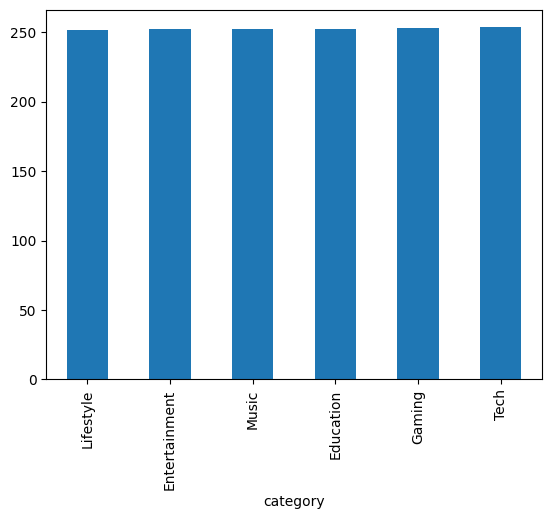

In [50]:
new_rev_data.groupby('category').ad_revenue_usd.mean().sort_values(ascending=True).plot(kind='bar')

In [51]:
encoded_data = pd.get_dummies(new_rev_data,columns=['category', 'device', 'country'],drop_first=True, dtype=int)
encoded_data.tail(2)

,views,likes,comments,watch_time_minutes,video_length_minutes,subscribers,ad_revenue_usd,year,engagement_rate,month,...,category_Music,category_Tech,device_Mobile,device_TV,device_Tablet,country_CA,country_DE,country_IN,country_UK,country_US
119998,10240,1616.0,106.000000,56967.384382,7.753099,585138,351.525811,2024,0.168164,12,...,1,0,1,0,0,0,0,0,1,0
119999,9931,770.0,274.623367,38466.837135,27.305703,517587,253.842824,2024,0.105188,6,...,0,1,0,1,0,1,0,0,0,0


In [52]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


In [53]:
TARGET = 'ad_revenue_usd'

numeric_features = [
    'views', 'likes', 'comments',
    'watch_time_minutes',
    'video_length_minutes',
    'subscribers',
    'year',
    'engagement_rate',
    'month',
    'dates',
    'days',
    'weekend'
]

categorical_features = ['category', 'device', 'country']


In [54]:


X = new_rev_data.drop(columns=[TARGET])
y = new_rev_data[TARGET]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)


In [55]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(drop='first', handle_unknown='ignore'), categorical_features)
    ]
)


In [56]:
def evaluate_model(name, model, X_test, y_test):
    y_pred = model.predict(X_test)

    return {
        'Model': name,
        'MAE': mean_absolute_error(y_test, y_pred),
        'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),
        'MSE': mean_squared_error(y_test, y_pred),
        'R2 Score': r2_score(y_test, y_pred)
    }

LINEAR REGRESSION

In [57]:
from sklearn.linear_model import LinearRegression

lr_pipeline = Pipeline([
    ('preprocess', preprocessor),
    ('model', LinearRegression())
])

lr_pipeline.fit(X_train, y_train)
lr_results = evaluate_model("Linear Regression", lr_pipeline, X_test, y_test)


GRADIENT BOOSTING REGRESSION

In [58]:
from sklearn.ensemble import GradientBoostingRegressor

gbr_pipeline = Pipeline([
    ('preprocess', preprocessor),
    ('model', GradientBoostingRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=3,
        random_state=42
    ))
])

gbr_pipeline.fit(X_train, y_train)
gbr_results = evaluate_model("Gradient Boosting", gbr_pipeline, X_test, y_test)


DECISION TREE REGRESSOR

In [59]:
from sklearn.tree import DecisionTreeRegressor

dt_pipeline = Pipeline([
    ('preprocess', preprocessor),
    ('model', DecisionTreeRegressor(
        max_depth=10,
        min_samples_split=20,
        random_state=42
    ))
])

dt_pipeline.fit(X_train, y_train)
dt_results = evaluate_model("Decision Tree", dt_pipeline, X_test, y_test)


KNN REGRESSION

In [60]:
from sklearn.neighbors import KNeighborsRegressor

knn_pipeline = Pipeline([
    ('preprocess', preprocessor),
    ('model', KNeighborsRegressor(
        n_neighbors=7,
        weights='distance'
    ))
])

knn_pipeline.fit(X_train, y_train)
knn_results = evaluate_model("KNN", knn_pipeline, X_test, y_test)


RANDOM FOREST REGRESSION

In [61]:
from sklearn.ensemble import RandomForestRegressor

rf_pipeline = Pipeline([
    ('preprocess', preprocessor),
    ('model', RandomForestRegressor(
        n_estimators=200,
        max_depth=15,
        min_samples_split=10,
        random_state=42,
        n_jobs=-1
    ))
])

rf_pipeline.fit(X_train, y_train)
rf_results = evaluate_model("Random Forest", rf_pipeline, X_test, y_test)


FINAL MODEL COMPARISON

In [62]:
import pandas as pd

results_df = pd.DataFrame([
    lr_results,
    gbr_results,
    dt_results,
    knn_results,
    rf_results
])

results_df.sort_values(by='R2 Score', ascending=False)


,Model,MAE,RMSE,MSE,R2 Score
0,Linear Regression,3.123529,13.482701,181.783233,0.952555
1,Gradient Boosting,3.504915,13.519936,182.788668,0.952293
4,Random Forest,3.488567,13.632721,185.851095,0.951494
2,Decision Tree,4.210785,13.765530,189.489819,0.950544
3,KNN,15.666985,21.540295,463.984291,0.878902


Selected Model LINEAR REGRESSION                                                              
| Criteria       | Reason          |
| -------------- | --------------- |
| Accuracy       | Highest R²      |
| Stability      | Lowest variance |
| Overfitting    | None            |
| Deployment     | Fast & reliable |


PICKLE

In [63]:
import pickle

with open("best_ad_revenue_model.pkl", "wb") as f:
    pickle.dump(lr_pipeline, f)
